# Vehicle Detection

In [6]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import pickle
import cv2
import glob
from lesson_functions import *
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from skimage.feature import hog
# NOTE: the next import is only valid for scikit-learn version <= 0.17
# for scikit-learn >= 0.18 use:
# from sklearn.model_selection import train_test_split
from sklearn.cross_validation import train_test_split
import time
import pickle
from scipy.ndimage.measurements import label

print("All module loaded")
%matplotlib inline

All module loaded


## Color Features

In [7]:
# Define a function to compute color histogram features  
# Pass the color_space flag as 3-letter all caps string
# like 'HSV' or 'LUV' etc.
def bin_spatial(img, color_space='RGB', size=(32, 32)):
    # Convert image to new color space (if specified)
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)             
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(feature_image, size).ravel() 
    # Return the feature vector
    return features

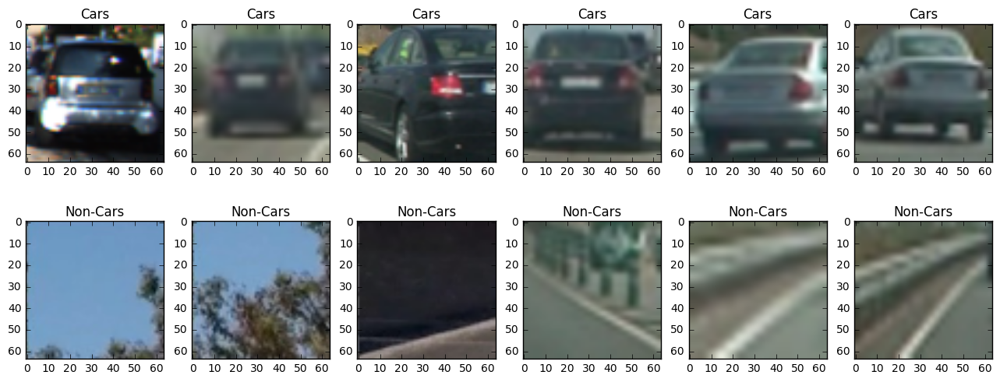

In [8]:
test_image = []
num_of_test_images = 12

for i in range(0,num_of_test_images):
    test_image.append(mpimg.imread("test_cars/%d.png"%i))
%matplotlib inline

f, axarr = plt.subplots(2, 6,figsize=(16, 6))
for i in range(0,2):
    for j in range((int)(num_of_test_images/2)):
        if i == 0:
            axarr[i][j].set_title('Cars')
        else:
            axarr[i][j].set_title('Non-Cars')
        axarr[i][j].imshow(test_image[(int)(num_of_test_images/2)*i+j])

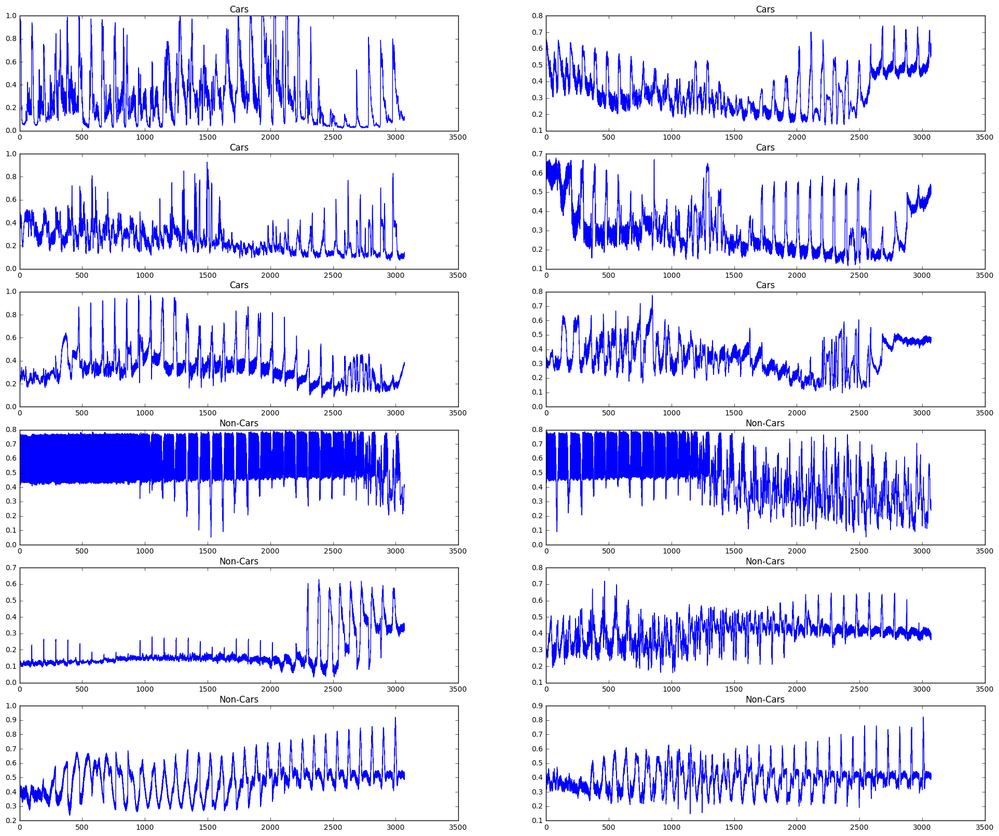

In [9]:
# Plot features
ff, axarrr = plt.subplots(6, 2,figsize=(24, 20))
plt.title('Spatially Binned Features')
for i in range((int)(num_of_test_images/2)):
    for j in range(0,2):
        if i < 3:
            axarrr[i][j].set_title('Cars')
        else:
            axarrr[i][j].set_title('Non-Cars')
        feature_vec = bin_spatial(test_image[i*2 + j], color_space='RGB', size=(32, 32))
        axarrr[i][j].plot(feature_vec)


## HOG Features

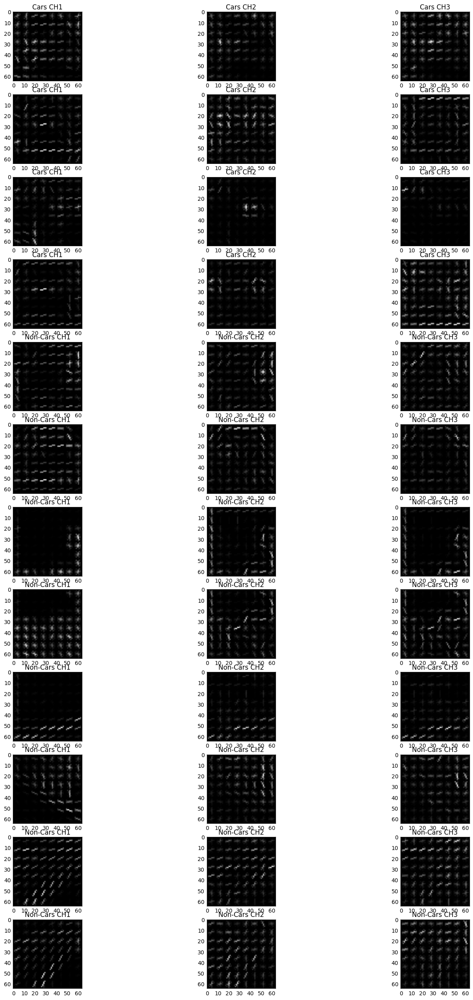

In [10]:
f, axarr = plt.subplots(num_of_test_images, 3,figsize=(18, 32))
for i in range(0,num_of_test_images):   
    ctrans_tosearch = convert_color(test_image[i], conv='RGB2YCrCb')
    
    for j in range(0, 3):
        [features, hog_image] = get_hog_features(ctrans_tosearch[:,:,j], orient = 9, pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
        s = "CH1"
        if j == 0:
            s = "CH1"
        elif j == 1:
            s = "CH2"
        else:
            s = "CH3"
            
        if i < num_of_test_images/3:
            axarr[i][j].set_title('Cars '+s)
        else:
            axarr[i][j].set_title('Non-Cars '+s)
            
        axarr[i][j].imshow(hog_image, cmap='gray')
        

## Hog Classifier

In [11]:
# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, cspace='RGB', orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if cspace != 'RGB':
            if cspace == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif cspace == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif cspace == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif cspace == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif cspace == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        # Call get_hog_features() with vis=False, feature_vec=True
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))
            hog_features = np.ravel(hog_features)        
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        # Append the new feature vector to the features list
        features.append(hog_features)
    # Return list of feature vectors
    return features


In [12]:
# Read images data set, divide up into cars and notcars
cars = glob.glob('vehicles/*/*.png')
notcars = glob.glob('non-vehicles/*/*.png')

len(notcars)



8968

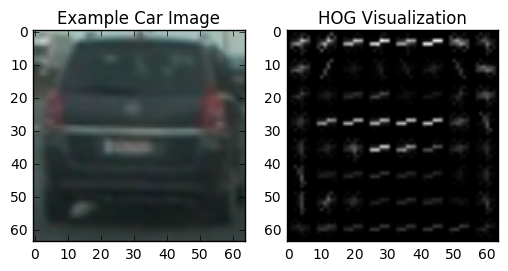

In [13]:
# Generate a random index to look at a car image
ind = np.random.randint(0, len(cars))
# Read in the image
image = mpimg.imread(cars[ind])
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
# Define HOG parameters
orient = 9
pix_per_cell = 8
cell_per_block = 2
# Call our function with vis=True to see an image output
features, hog_image = get_hog_features(gray, orient, 
                        pix_per_cell, cell_per_block, 
                        vis=True, feature_vec=False)


# Plot the examples
fig = plt.figure()
plt.subplot(121)
plt.imshow(image, cmap='gray')
plt.title('Example Car Image')
plt.subplot(122)
plt.imshow(hog_image, cmap='gray')
plt.title('HOG Visualization')

## HOG features with SVC Classifier

Finally I decide to use HOG features for training, as it's simple and efficient, at least two times faster than using both color and HOG features.

In [14]:
# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, cspace='RGB', orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if cspace != 'RGB':
            if cspace == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif cspace == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif cspace == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif cspace == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif cspace == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        # Call get_hog_features() with vis=False, feature_vec=True
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))
            hog_features = np.ravel(hog_features)        
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        # Append the new feature vector to the features list
        features.append(hog_features)
    # Return list of feature vectors
    return features

In [198]:
colorspace = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9
pix_per_cell = 8
cell_per_block = 2
hog_channel = "ALL" # Can be 0, 1, 2, or "ALL"

t=time.time()
car_features = extract_features(cars, cspace=colorspace, orient=orient, 
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                        hog_channel=hog_channel)
notcar_features = extract_features(notcars, cspace=colorspace, orient=orient, 
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                        hog_channel=hog_channel)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to extract HOG features...')
# Create an array stack of feature vectors
X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))


# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.2, random_state=rand_state)

print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))
# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
# Check the prediction time for a single sample
t=time.time()
n_predict = 10
print('My SVC predicts: ', svc.predict(X_test[0:n_predict]))
print('For these',n_predict, 'labels: ', y_test[0:n_predict])
t2 = time.time()
print(round(t2-t, 5), 'Seconds to predict', n_predict,'labels with SVC')

54.5 Seconds to extract HOG features...
Using: 9 orientations 8 pixels per cell and 2 cells per block
Feature vector length: 5292
13.1 Seconds to train SVC...
Test Accuracy of SVC =  0.9825
My SVC predicts:  [ 0.  0.  1.  1.  1.  1.  1.  1.  0.  0.]
For these 10 labels:  [ 0.  0.  1.  1.  1.  1.  1.  1.  0.  0.]
0.00096 Seconds to predict 10 labels with SVC


In [199]:
# Save Parameter
D = {'svc':svc,'scaler':X_scaler,'orient':orient,'cell_per_block':cell_per_block,'pix_per_cell':pix_per_cell,'spatial_size':(32,32),'hist_bins':32}
f = open('svc_pickle.p','wb')
pickle.dump(D,f)
f.close()
print("Parameter Saved")





Parameter Saved


In [7]:
# Read Parameter
dist_pickle = pickle.load( open("svc_pickle.p", "rb" ) )
svc = dist_pickle["svc"]
X_scaler = dist_pickle["scaler"]
orient = dist_pickle["orient"]
pix_per_cell = dist_pickle["pix_per_cell"]
cell_per_block = dist_pickle["cell_per_block"]
spatial_size = dist_pickle["spatial_size"]
hist_bins = dist_pickle["hist_bins"]
print("Parameter Opened")

Parameter Opened


## Window Search

In [8]:
def find_cars(img, ystart, ystop, scales, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
    
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
        
    boxes = []
    i = 0
    for scale in scales:
        print (scale)
        
        i += 1
        if scale != 1:
            imshape = ctrans_tosearch.shape
            ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))

        ch1 = ctrans_tosearch[:,:,0]
        ch2 = ctrans_tosearch[:,:,1]
        ch3 = ctrans_tosearch[:,:,2]

        # Define blocks and steps as above
        nxblocks = (ch1.shape[1] // pix_per_cell)-1
        nyblocks = (ch1.shape[0] // pix_per_cell)-1 
        nfeat_per_block = orient*cell_per_block**2
        # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
        window = 64
        nblocks_per_window = (window // pix_per_cell)-1 
        cells_per_step = 2  # Instead of overlap, define how many cells to step
        nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
        nysteps = (nyblocks - nblocks_per_window) // cells_per_step

        # Compute individual channel HOG features for the entire image
        hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
        hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
        hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)

        for xb in range(nxsteps):
            for yb in range(nysteps):
                ypos = yb*cells_per_step
                xpos = xb*cells_per_step
                # Extract HOG for this patch
                hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

                xleft = xpos*pix_per_cell
                ytop = ypos*pix_per_cell

                # Extract the image patch
                subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))

                # Get color features
    #             spatial_features = bin_spatial(subimg, size=spatial_size)
    #             hist_features = color_hist(subimg, nbins=hist_bins)

                # Scale features and make a prediction
                test_features = X_scaler.transform(np.hstack((hog_features)).reshape(1, -1))    
                #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
                test_prediction = svc.predict(test_features)

                if test_prediction == 1:
                    xbox_left = np.int(xleft*scale)
                    ytop_draw = np.int(ytop*scale)
                    win_draw = np.int(window*scale)
                    cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6) 
                    boxes.append([[xbox_left, ytop_draw+ystart],[xbox_left+win_draw,ytop_draw+win_draw+ystart]])
    return [draw_img, boxes]
    


1.5
3


20

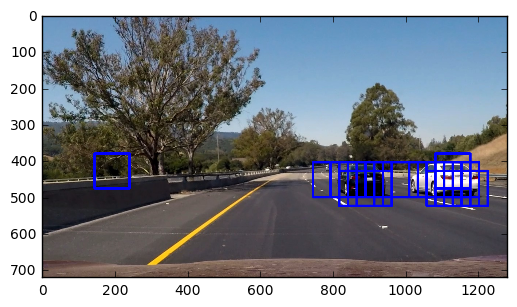

In [19]:
img = mpimg.imread("test_images/test6.jpg")

ystart = 380
ystop = 656
scale = 1
spatial_size = (32,32)
hist_bins = 32

#choose the scale for 1.5 and 3, to increase the searching speed
[out_img, boxes] = find_cars(img, ystart, ystop, [1.5,3], svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
plt.imshow(out_img)
len(boxes)


In [10]:
boxes

[[[816, 380], [912, 476]],
 [[864, 380], [960, 476]],
 [[864, 404], [960, 500]],
 [[888, 380], [984, 476]]]

## Heat Map

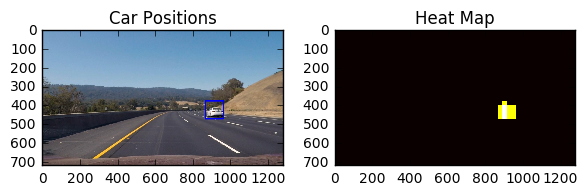

In [11]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

heat = np.zeros_like(img[:,:,0]).astype(np.float)

# Add heat to each box in box list
heat = add_heat(heat,boxes)
    
# Apply threshold to help remove false positives
heat = apply_threshold(heat,2)

# Visualize the heatmap when displaying    
heatmap = np.clip(heat, 0, 255)

# Find final boxes from heatmap using label function
labels = label(heatmap)
draw_img = draw_labeled_bboxes(np.copy(img), labels)

fig = plt.figure()
plt.subplot(121)
plt.imshow(draw_img)
plt.title('Car Positions')
plt.subplot(122)
plt.imshow(heatmap, cmap='hot')
plt.title('Heat Map')
fig.tight_layout()



## Final Code

For pipeline, I decide to filter the output twice.

1. I output the heat by each frame, sum `m` previous frames, add threashould and output them as `heat_combine`, This is so called `filter1`
2. For output of `heat_combine`, I set all positive pixals to 1, this can decrease the effect of false positives.
3. Then I sum `n` previous `heat_combine`, add threashould and output them as `heat2_combine`, This is so called `filter2` 

Then I tuning the parameter of `m`,`n` and threshould for each step.


In [28]:

#m frames of filter1
filter_frame = 12

#n frames of filter2
filter2_frame = 18

#initialize output images and heats for each step
output_images = []
heat_frames = []
heat2_frames = []
k = 0
for i in range(0,filter_frame):
    heat = np.zeros_like(img[:,:,0]).astype(np.float)
    heat_frames.append(heat)
for i in range(0,filter2_frame):
    heat = np.zeros_like(img[:,:,0]).astype(np.float)
    heat2_frames.append(heat)
    
heat = np.zeros_like(img[:,:,0]).astype(np.float)
heat[0][0] = 10
high_values_indices = heat > 0
heat[high_values_indices] = 1
heat
    

array([[ 1.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       ..., 
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.]])

In [29]:
def detect_cars(image):
    [rough_img, boxes] = find_cars(image,  ystart, ystop, [1.5,3], svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    heat_combine = np.zeros_like(image[:,:,0]).astype(np.float)
    heat2_combine = np.zeros_like(image[:,:,0]).astype(np.float)

#Original Frames
    # Add heat to each box in box list
    heat = add_heat(heat,boxes)
    
    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,0)
    heatmap_o = np.clip(heat, 0, 255)
    
#Filter1 
    for i in range(0,filter_frame-1):
        heat_frames[i] = heat_frames[i+1]
    heat_frames[filter_frame-1] = heat
    
    for i in range(0,filter_frame):
        heat_combine += heat_frames[i]
    heat_combine = apply_threshold(heat_combine,10)
    
    
    
    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat_combine, 0, 255)

#Set all positive outputs to 1

    high_values_indices = heat_combine > 1
    heat_combine[high_values_indices] = 1
    
#Filter 2    
    for i in range(0,filter2_frame-1):
        heat2_frames[i] = heat2_frames[i+1]
        heat2_frames[filter2_frame-1] = heat_combine
        
    for i in range(0,filter2_frame):
        heat2_combine += heat2_frames[i]
    heat2_combine = apply_threshold(heat2_combine,17)
    
    heatmap2 = np.clip(heat2_combine, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap2)
    draw_img= draw_labeled_bboxes(np.copy(image), labels)

    #This is for result display and testing
    output_images.append([rough_img,heatmap_o, heatmap, heatmap2,draw_img])

    return draw_img

In [30]:
from moviepy.editor import VideoFileClip

output = 't1_10|12_17|18.mp4'
clip1 = VideoFileClip("test1.mp4")
output_clip = clip1.fl_image(detect_cars) #NOTE: this function expects color images!!

%time output_clip.write_videofile(output, audio=False)

1.5
3
[MoviePy] >>>> Building video t1_10|12_17|18.mp4
[MoviePy] Writing video t1_10|12_17|18.mp4


  0%|          | 0/90 [00:00<?, ?it/s]

1.5


  1%|          | 1/90 [00:07<10:23,  7.01s/it]

3
1.5


  2%|▏         | 2/90 [00:15<10:52,  7.42s/it]

3
1.5


  3%|▎         | 3/90 [00:24<11:22,  7.85s/it]

3
1.5


  4%|▍         | 4/90 [00:33<12:03,  8.42s/it]

3
1.5


  6%|▌         | 5/90 [00:43<12:11,  8.61s/it]

3
1.5


  7%|▋         | 6/90 [00:51<11:59,  8.57s/it]

3
1.5


  8%|▊         | 7/90 [00:59<11:39,  8.43s/it]

3
1.5


  9%|▉         | 8/90 [01:06<11:01,  8.06s/it]

3
1.5


 10%|█         | 9/90 [01:13<10:30,  7.79s/it]

3
1.5


 11%|█         | 10/90 [01:25<11:48,  8.86s/it]

3
1.5


 12%|█▏        | 11/90 [01:34<11:39,  8.85s/it]

3
1.5


 13%|█▎        | 12/90 [01:42<11:21,  8.73s/it]

3
1.5


 14%|█▍        | 13/90 [01:50<10:44,  8.37s/it]

3
1.5


 16%|█▌        | 14/90 [01:57<10:18,  8.14s/it]

3
1.5


 17%|█▋        | 15/90 [02:06<10:16,  8.22s/it]

3
1.5


 18%|█▊        | 16/90 [02:14<10:19,  8.37s/it]

3
1.5


 19%|█▉        | 17/90 [02:23<10:07,  8.33s/it]

3
1.5


 20%|██        | 18/90 [02:31<10:06,  8.42s/it]

3
1.5


 21%|██        | 19/90 [02:40<10:11,  8.61s/it]

3
1.5


 22%|██▏       | 20/90 [02:49<09:56,  8.52s/it]

3
1.5


 23%|██▎       | 21/90 [02:57<09:41,  8.43s/it]

3
1.5


 24%|██▍       | 22/90 [03:05<09:24,  8.31s/it]

3
1.5


 26%|██▌       | 23/90 [03:15<09:47,  8.77s/it]

3
1.5


 27%|██▋       | 24/90 [03:25<10:10,  9.25s/it]

3
1.5


 28%|██▊       | 25/90 [03:36<10:37,  9.81s/it]

3
1.5


 29%|██▉       | 26/90 [03:47<10:51, 10.18s/it]

3
1.5


 30%|███       | 27/90 [03:56<10:19,  9.83s/it]

3
1.5


 31%|███       | 28/90 [04:05<09:51,  9.54s/it]

3
1.5


 32%|███▏      | 29/90 [04:14<09:24,  9.26s/it]

3
1.5


 33%|███▎      | 30/90 [04:22<09:03,  9.06s/it]

3
1.5


 34%|███▍      | 31/90 [04:31<08:56,  9.10s/it]

3
1.5


 36%|███▌      | 32/90 [04:42<09:08,  9.45s/it]

3
1.5


 37%|███▋      | 33/90 [04:53<09:22,  9.86s/it]

3
1.5


 38%|███▊      | 34/90 [05:02<09:05,  9.74s/it]

3
1.5


 39%|███▉      | 35/90 [05:11<08:47,  9.58s/it]

3
1.5


 40%|████      | 36/90 [05:20<08:21,  9.28s/it]

3
1.5


 41%|████      | 37/90 [05:30<08:19,  9.42s/it]

3
1.5


 42%|████▏     | 38/90 [05:39<08:02,  9.28s/it]

3
1.5


 43%|████▎     | 39/90 [05:47<07:46,  9.15s/it]

3
1.5


 44%|████▍     | 40/90 [05:57<07:39,  9.18s/it]

3
1.5


 46%|████▌     | 41/90 [06:07<07:46,  9.52s/it]

3
1.5
3


KeyboardInterrupt: 

In [31]:
len(output_images)

42

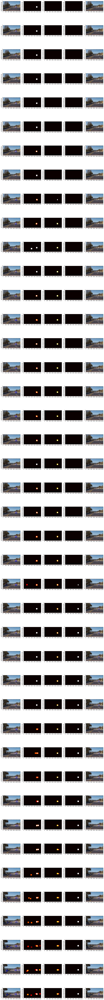

In [32]:
f, axarr = plt.subplots(len(output_images), 5,figsize=(18, 180))
for i in range(0,len(output_images)):   
    
    for j in range(0, 5):
#         [features, hog_image] = get_hog_features(ctrans_tosearch[:,:,j], orient = 9, pix_per_cell = 8, cell_per_block = 2, vis=True, feature_vec=True)
#         s = "CH1"
#         if j == 0:
#             s = "CH1"
#         elif j == 1:
#             s = "CH2"
#         else:
#             s = "CH3"
            
#         if i < num_of_test_images/3:
#             axarr[i][j].set_title('Cars '+s)
#         else:
#             axarr[i][j].set_title('Non-Cars '+s)
        if j ==0 | j ==4:
            axarr[i][j].imshow(output_images[i][j])
        else:
            axarr[i][j].imshow(output_images[i][j],cmap='hot')
            
        